Copyright **`(c)`** 2025 Giovanni Squillero `<giovanni.squillero@polito.it>`  
[`https://github.com/squillero/computational-intelligence`](https://github.com/squillero/computational-intelligence)  
Free under certain conditions — see the [`license`](https://github.com/squillero/computational-intelligence/blob/master/LICENSE.md) for details.  

In [304]:
import logging
from itertools import combinations

import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

from icecream import ic

import random
import math

Cost: $d + (d \cdot \alpha \cdot w)^\beta$ with $\alpha \ge 0$ and $\beta \ge 0$

In [305]:
class Problem:
    _graph: nx.Graph
    _alpha: float
    _beta: float

    def __init__(
        self,
        num_cities: int,
        *,
        alpha: float = 1.0,
        beta: float = 1.0,
        density: float = 0.5,
        seed: int = 42,
    ):
        rng = np.random.default_rng(seed)
        self._alpha = alpha
        self._beta = beta
        cities = rng.random(size=(num_cities, 2))
        cities[0, 0] = cities[0, 1] = 0.5

        self._graph = nx.Graph()
        self._graph.add_node(0, pos=(cities[0, 0], cities[0, 1]), gold=0)
        for c in range(1, num_cities):
            self._graph.add_node(
                c, pos=(cities[c, 0], cities[c, 1]), gold=(1 + 999 * rng.random()))

        tmp = cities[:, np.newaxis, :] - cities[np.newaxis, :, :]
        d = np.sqrt(np.sum(np.square(tmp), axis=-1))
        for c1, c2 in combinations(range(num_cities), 2):
            if rng.random() < density or c2 == c1 + 1:
                self._graph.add_edge(c1, c2, dist=d[c1, c2])

        assert nx.is_connected(self._graph)

    @property
    def graph(self) -> nx.Graph:
        return nx.Graph(self._graph)

    @property
    def alpha(self):
        return self._alpha

    @property
    def beta(self):
        return self._beta

    def cost(self, path, weight):
        dist = nx.path_weight(self._graph, path, weight='dist')
        return dist + (self._alpha * dist * weight) ** self._beta

    def baseline(self):
        total_cost = 0
        for dest, path in nx.single_source_dijkstra_path(
            self._graph, source=0, weight='dist'
        ).items():
            cost = 0
            for c1, c2 in zip(path, path[1:]):
                ic(c1, c2, self.cost([c2, c1], 0))
                cost += self.cost([c2, c1], 0)
                cost += self.cost([c2, c1],
                                  self._graph.nodes[dest]['gold'])
            logging.debug(
                f"dummy_solution: go to {dest} ({' > '.join(str(n) for n in path)} ({cost})"
            )
            total_cost += cost
        return total_cost

    def plot(self):
        plt.figure(figsize=(10, 10))
        pos = nx.get_node_attributes(self._graph, 'pos')
        size = [100] + [self._graph.nodes[n]['gold']
                        for n in range(1, len(self._graph))]
        color = ['red'] + ['lightblue'] * (len(self._graph) - 1)
        nx.draw(self._graph, pos, with_labels=True,
                node_color=color, node_size=size)
        # assumes 'weight' stores distance
        edge_labels = nx.get_edge_attributes(self._graph, 'dist')
        nx.draw_networkx_edge_labels(self._graph, pos, edge_labels=edge_labels)
        plt.show()

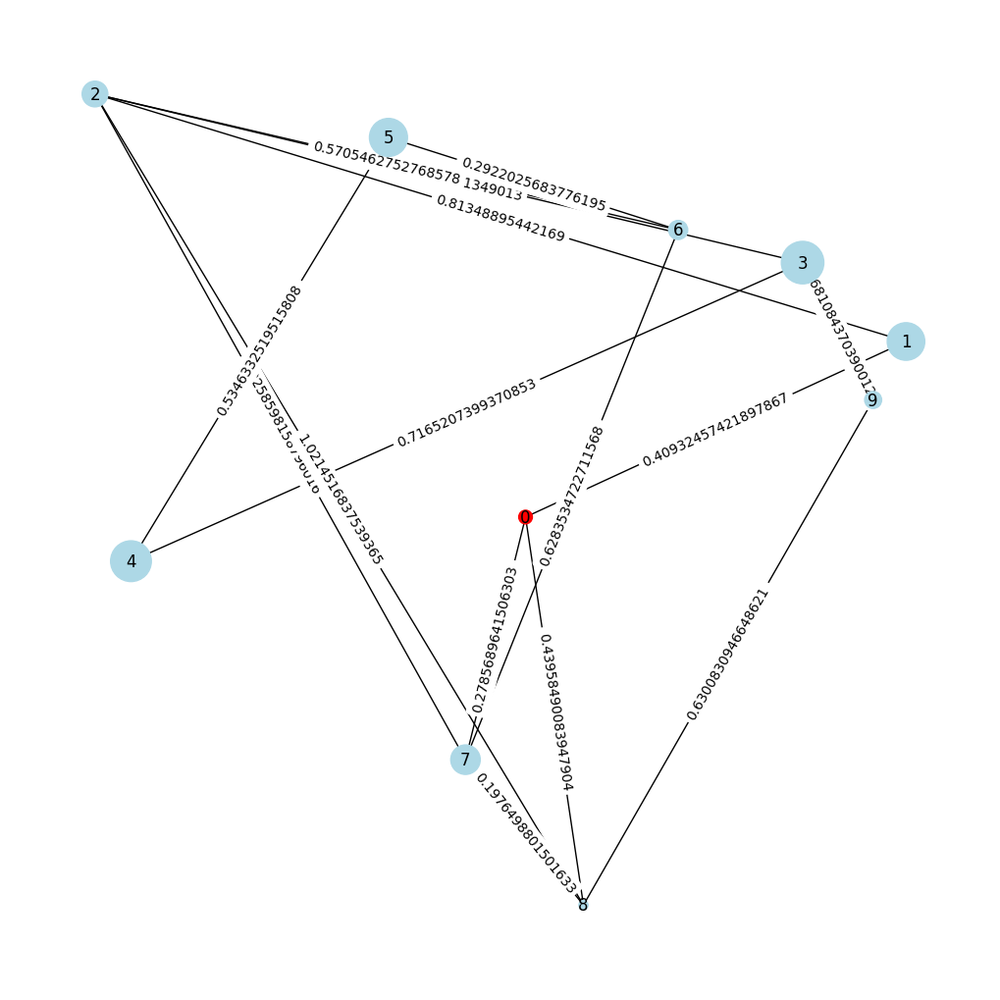

In [306]:
P = Problem(10, density=0.2, alpha=1, beta=1)
P.plot()

In [307]:
logging.getLogger().setLevel(logging.WARNING)

ic(Problem(100, density=0.2, alpha=1, beta=1).baseline())
ic(Problem(100, density=0.2, alpha=2, beta=1).baseline())
ic(Problem(100, density=0.2, alpha=1, beta=2).baseline())
ic(Problem(100, density=1, alpha=1, beta=1).baseline())
ic(Problem(100, density=1, alpha=2, beta=1).baseline())
ic(Problem(100, density=1, alpha=1, beta=2).baseline())
ic(Problem(1_000, density=0.2, alpha=1, beta=1).baseline())
ic(Problem(1_000, density=0.2, alpha=2, beta=1).baseline())
ic(Problem(1_000, density=0.2, alpha=1, beta=2).baseline())
ic(Problem(1_000, density=1, alpha=1, beta=1).baseline())
ic(Problem(1_000, density=1, alpha=2, beta=1).baseline())
ic(Problem(1_000, density=1, alpha=1, beta=2).baseline())
None

ic| c1: 0
    c2: 1
    self.cost([c2, c1], 0): np.float64(0.40932457421897867)
ic| c1: 0
    c2: 3
    self.cost([c2, c1], 0): np.float64(0.3873328422806367)
ic| c1: 0
    c2: 11
    self.cost([c2, c1], 0): np.float64(0.6132706141654652)
ic| c1: 0
    c2: 36
    self.cost([c2, c1], 0): np.float64(0.44235950241515554)
ic| c1: 0
    c2: 38
    self.cost([c2, c1], 0): np.float64(0.2623366054788834)
ic| c1: 0
    c2: 40
    self.cost([c2, c1], 0): np.float64(0.18910938434133978)
ic| c1: 0
    c2: 42
    self.cost([c2, c1], 0): np.float64(0.6291776550282161)
ic| c1: 0
    c2: 51
    self.cost([c2, c1], 0): np.float64(0.524350405748008)
ic| c1: 0
    c2: 53
    self.cost([c2, c1], 0): np.float64(0.23331987402676618)
ic| c1: 0
    c2: 63
    self.cost([c2, c1], 0): np.float64(0.39409422651215215)
ic| c1: 0
    c2: 64
    self.cost([c2, c1], 0): np.float64(0.40616594766609077)
ic| c1: 0
    c2: 65
    self.cost([c2, c1], 0): np.float64(0.5378067565827367)
ic| c1: 0
    c2: 76
    self.cost([c

In [ ]:
class MySimulatedAnnealingSolver:
    def __init__(self, problem: Problem):
        self.problem = problem
        self.graph = problem.graph
        self.nodes = list(self.graph.nodes)
        self.gold = {n: self.graph.nodes[n]['gold'] for n in self.nodes}
        shortestPaths = dict(
            nx.all_pairs_dijkstra_path(self.graph, weight='dist'))
        self.distMatrix = dict(
            nx.all_pairs_dijkstra_path_length(self.graph, weight='dist'))
        # this is the matrix of the sum of distance between each 2 points raised to the power of beta
        self.distMatrixToPowerBeta = dict()
        for x in range(len(self.nodes)):
            self.distMatrixToPowerBeta[x] = {}
            for y in range(len(self.nodes)):
                total = 0
                for i in range(len(shortestPaths[x][y]) - 1):
                    total += self.distMatrix[shortestPaths[x][y]
                                               [i]][shortestPaths[x][y][i+1]] ** problem.beta
                self.distMatrixToPowerBeta[x][y] = total

    def getPathCost(self, u, v, weight):
        # instead of calculating the cost each time by going through all the points
        # we just put the the pre calculated values into the modified cost function
        dist = self.distMatrix[u][v]
        distToPowerBeta = self.distMatrixToPowerBeta[u][v]
        return dist + ((self.problem.alpha * weight) ** self.problem.beta) * distToPowerBeta
        dist = self.distMatrix[u][v]
        distToPowerBeta = self.distMatrixToPowerBeta[u][v]
        return dist + ((self.problem.alpha * dist * weight) ** self.problem.beta)

    def splitPermutation(self, permutation):
        # basically here we will decide if we go from the beginning of the permutaion to the
        # end of it without visiting the beginning again or we should put
        # a trip to the beginning in a specific point
        n = len(permutation)
        V = {i: float('inf') for i in range(n + 1)}
        V[0] = 0
        P = {i: -1 for i in range(n + 1)}

        for i in range(n):
            currentLoad = 0
            routeCost = 0
            u = 0

            for j in range(i + 1, n + 1):
                v = permutation[j-1]

                routeCost += self.getPathCost(u, v, currentLoad)
                currentLoad += self.gold[v]

                returnCost = self.getPathCost(v, 0, currentLoad)

                total = routeCost + returnCost

                if V[i] + total < V[j]:
                    V[j] = V[i] + total
                    P[j] = i

                u = v

        routes = []
        curr = n
        while curr > 0:
            prev = P[curr]
            routes.append(permutation[prev:curr])
            curr = prev
        routes.reverse()
        return V[n], routes

    def getNeighbor(self, permutation):
        newPermutation = permutation[:]
        n = len(newPermutation)

        if random.random() < 0.5:
            i, j = random.sample(range(n), 2)
            newPermutation[i], newPermutation[j] = newPermutation[j], newPermutation[i]
        else:
            i, j = sorted(random.sample(range(n), 2))
            newPermutation[i:j+1] = reversed(newPermutation[i:j+1])

        return newPermutation

    def run(self, initialTemp=1000, coolingRate=0.995, maxIterations=2000):
        customers = [n for n in self.nodes if n != 0]
        currentPerm = customers[:]
        random.shuffle(currentPerm)

        currentCost, currentRoutes = self.splitPermutation(currentPerm)

        bestPermutation = currentPerm
        bestCost = currentCost
        bestRoutes = currentRoutes

        temp = initialTemp

        for i in range(maxIterations):
            neighborPermutation = self.getNeighbor(currentPerm)
            neighborCost, neighborRoutes = self.splitPermutation(
                neighborPermutation)

            delta = neighborCost - currentCost

            if delta < 0 or random.random() < math.exp(-delta / temp):
                currentPerm = neighborPermutation
                currentCost = neighborCost
                currentRoutes = neighborRoutes

                if currentCost < bestCost:
                    bestCost = currentCost
                    bestRoutes = currentRoutes
                    bestPermutation = currentPerm

            temp *= coolingRate

            if temp < 0.001:
                break
        
        ic(bestRoutes, bestPermutation)
        
        return bestCost

In [309]:
logging.getLogger().setLevel(logging.DEBUG)
test = Problem(100, density=0.1, alpha=1, beta=2)
saTest = MySimulatedAnnealingSolver(test)

In [313]:
baseline = test.baseline()
mySolution = saTest.run()
ic(baseline, mySolution)

DEBUG:root:dummy_solution: go to 0 (0 (0)
ic| c1: 0
    c2: 1
    self.cost([c2, c1], 0): np.float64(0.40932457421897867)
DEBUG:root:dummy_solution: go to 1 (0 > 1 (101316.9933620923)
ic| c1: 0
    c2: 38
    self.cost([c2, c1], 0): np.float64(0.2623366054788834)
DEBUG:root:dummy_solution: go to 38 (0 > 38 (42407.13101332585)
ic| c1: 0
    c2: 40
    self.cost([c2, c1], 0): np.float64(0.18910938434133978)
DEBUG:root:dummy_solution: go to 40 (0 > 40 (433.37702087970837)
ic| c1: 0
    c2: 51
    self.cost([c2, c1], 0): np.float64(0.524350405748008)
DEBUG:root:dummy_solution: go to 51 (0 > 51 (116980.64981814062)
ic| c1: 0
    c2: 65
    self.cost([c2, c1], 0): np.float64(0.5378067565827367)
DEBUG:root:dummy_solution: go to 65 (0 > 65 (245369.37465400234)
ic| c1: 0
    c2: 96
    self.cost([c2, c1], 0): np.float64(0.5019434023873135)
DEBUG:root:dummy_solution: go to 96 (0 > 96 (205327.48617947518)
ic| c1: 0
    c2: 40
    self.cost([c2, c1], 0): np.float64(0.18910938434133978)
ic| c1: 40


(np.float64(7498070.525327924), np.float64(7182532.393639378))